    Grillo, Gian Franco.


# 

Imports para los ejercicios

In [1]:
import pandas as pd
import numpy as np

import matplotlib.pyplot as plt
import seaborn as sns

import pandas_profiling

In [2]:
#Seteo para ver todas las columnas cuando muestro un dataframe
pd.set_option('display.max_columns', None)

%matplotlib inline

# 

# CONSIGNA

Realizar un pequeño análisis Bivariado de datos, teniendo en cuenta las características de las observaciones. Generar al menos 3 gráficos asociados.

#  

# 

## The Spotify Hit Predictor Dataset (1960-2019).

Cargamos y vemos el dataset

In [3]:
df_spotify = pd.read_csv('https://raw.githubusercontent.com/gfgrillo3/DS_CoderHouse/main/Datasets/dataset-of-10s.csv', sep=',')

df_spotify

,track,artist,uri,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,duration_ms,time_signature,chorus_hit,sections,target
0,Wild Things,Alessia Cara,spotify:track:2ZyuwVvV6Z3XJaXIFbspeE,0.741,0.626,1,-4.826,0,0.0886,0.02000,0.000000,0.0828,0.7060,108.029,188493,4,41.18681,10,1
1,Surfboard,Esquivel!,spotify:track:61APOtq25SCMuK0V5w2Kgp,0.447,0.247,5,-14.661,0,0.0346,0.87100,0.814000,0.0946,0.2500,155.489,176880,3,33.18083,9,0
2,Love Someone,Lukas Graham,spotify:track:2JqnpexlO9dmvjUMCaLCLJ,0.550,0.415,9,-6.557,0,0.0520,0.16100,0.000000,0.1080,0.2740,172.065,205463,4,44.89147,9,1
3,Music To My Ears (feat. Tory Lanez),Keys N Krates,spotify:track:0cjfLhk8WJ3etPTCseKXtk,0.502,0.648,0,-5.698,0,0.0527,0.00513,0.000000,0.2040,0.2910,91.837,193043,4,29.52521,7,0
4,Juju On That Beat (TZ Anthem),Zay Hilfigerrr & Zayion McCall,spotify:track:1lItf5ZXJc1by9SbPeljFd,0.807,0.887,1,-3.892,1,0.2750,0.00381,0.000000,0.3910,0.7800,160.517,144244,4,24.99199,8,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6393,Lotus Flowers,Yolta,spotify:track:4t1TljQWJ6ZuoSY67zVvBI,0.172,0.358,9,-14.430,1,0.0342,0.88600,0.966000,0.3140,0.0361,72.272,150857,4,24.30824,7,0
6394,Calling My Spirit,Kodak Black,spotify:track:2MShy1GSSgbmGUxADNIao5,0.910,0.366,1,-9.954,1,0.0941,0.09960,0.000000,0.2610,0.7400,119.985,152000,4,32.53856,8,1
6395,Teenage Dream,Katy Perry,spotify:track:55qBw1900pZKfXJ6Q9A2Lc,0.719,0.804,10,-4.581,1,0.0355,0.01320,0.000003,0.1390,0.6050,119.999,227760,4,20.73371,7,1
6396,Stormy Weather,Oscar Peterson,spotify:track:4o9npmYHrOF1rUxxTVH8h4,0.600,0.177,7,-16.070,1,0.0561,0.98900,0.868000,0.1490,0.5600,120.030,213387,4,21.65301,14,0


# 

#### Tamaño 

In [4]:
print("{} filas y {} columnas.".format(df_spotify.shape[0], df_spotify.shape[1]))

6398 filas y 19 columnas.


# 

#### Info resumen del DF

In [5]:
df_spotify.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6398 entries, 0 to 6397
Data columns (total 19 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   track             6398 non-null   object 
 1   artist            6398 non-null   object 
 2   uri               6398 non-null   object 
 3   danceability      6398 non-null   float64
 4   energy            6398 non-null   float64
 5   key               6398 non-null   int64  
 6   loudness          6398 non-null   float64
 7   mode              6398 non-null   int64  
 8   speechiness       6398 non-null   float64
 9   acousticness      6398 non-null   float64
 10  instrumentalness  6398 non-null   float64
 11  liveness          6398 non-null   float64
 12  valence           6398 non-null   float64
 13  tempo             6398 non-null   float64
 14  duration_ms       6398 non-null   int64  
 15  time_signature    6398 non-null   int64  
 16  chorus_hit        6398 non-null   float64


# 

#### Estadísticas descriptivas del DF 

In [6]:
df_spotify.describe().T

,count,mean,std,min,25%,50%,75%,max
danceability,6398.0,0.568163,0.191103,0.062200,0.447000,0.588000,0.710000,9.810000e-01
energy,6398.0,0.667756,0.240721,0.000251,0.533000,0.712500,0.857000,9.990000e-01
key,6398.0,5.283526,3.606216,0.000000,2.000000,5.000000,8.000000,1.100000e+01
loudness,6398.0,-7.589796,5.234592,-46.655000,-8.425000,-6.096500,-4.601250,-1.490000e-01
mode,6398.0,0.645514,0.478395,0.000000,0.000000,1.000000,1.000000,1.000000e+00
speechiness,6398.0,0.098018,0.097224,0.022500,0.038825,0.057200,0.112000,9.560000e-01
acousticness,6398.0,0.216928,0.296835,0.000000,0.008533,0.067050,0.311000,9.960000e-01
instrumentalness,6398.0,0.165293,0.318736,0.000000,0.000000,0.000017,0.057650,9.950000e-01
liveness,6398.0,0.196700,0.166148,0.016700,0.096800,0.126000,0.249000,9.820000e-01
valence,6398.0,0.443734,0.245776,0.000000,0.240000,0.434000,0.628000,9.760000e-01


# 

#### Análisis de nulos 

In [7]:
df_spotify.isna().sum()

track               0
artist              0
uri                 0
danceability        0
energy              0
key                 0
loudness            0
mode                0
speechiness         0
acousticness        0
instrumentalness    0
liveness            0
valence             0
tempo               0
duration_ms         0
time_signature      0
chorus_hit          0
sections            0
target              0
dtype: int64

Vemos que no tenemos nulos

# 

#### Tipos de datos de las columnas

In [8]:
df_spotify.dtypes

track                object
artist               object
uri                  object
danceability        float64
energy              float64
key                   int64
loudness            float64
mode                  int64
speechiness         float64
acousticness        float64
instrumentalness    float64
liveness            float64
valence             float64
tempo               float64
duration_ms           int64
time_signature        int64
chorus_hit          float64
sections              int64
target                int64
dtype: object

# 

#### Columnas disponibles

In [9]:
df_spotify.columns

Index(['track', 'artist', 'uri', 'danceability', 'energy', 'key', 'loudness',
       'mode', 'speechiness', 'acousticness', 'instrumentalness', 'liveness',
       'valence', 'tempo', 'duration_ms', 'time_signature', 'chorus_hit',
       'sections', 'target'],
      dtype='object')

# 

#### Recordemos las variables y su descripción

- track: Nombre de la canción.


- artist: Nombre del artista.


- uri: Identificador del recurso de la canción.


- danceability: Capacidad de baile. Describe qué tan adecuada es una pista para bailar en función de una combinación de elementos musicales que incluyen el tempo, la estabilidad del ritmo, la fuerza del ritmo y la regularidad general. Un valor de 0.0 es menos bailable y 1.0 es más bailable


- energy: la energía es una medida de 0.0 a 1.0 y representa una medida perceptiva de intensidad y actividad. Por lo general, las pistas enérgicas se sienten rápidas, altas y ruidosas. Por ejemplo, el death metal tiene mucha energía, mientras que un preludio de Bach tiene una puntuación baja en la escala. Las características de percepción que contribuyen a este atributo incluyen rango dinámico, volumen percibido, timbre, frecuencia de inicio y entropía general.


- key: Clave general estimada de la pista. Los enteros se asignan a los tonos utilizando la notación estándar de clase de tono. P.ej. 0 = C, 1 = C?/D?, 2 = D, y así sucesivamente. Si no se detectó ninguna clave, el valor es -1.


- loudness: Volumen general de una pista en decibelios (dB). Los valores de sonoridad se promedian en toda la pista y son útiles para comparar la sonoridad relativa de las pistas. La sonoridad es la cualidad de un sonido que es el principal correlato psicológico de la fuerza física (amplitud). Los valores típicos oscilan entre -60 y 0 db.


- mode: Indica la modalidad (mayor o menor) de una pista, el tipo de escala de la que se deriva su contenido melódico. Mayor está representado por 1 y menor es 0.


- speechiness: El habla detecta la presencia de palabras habladas en una pista. Cuanto más exclusivamente parecida a un discurso sea la grabación (por ejemplo, programa de entrevistas, audiolibro, poesía), más cercano a 1.0 será el valor del atributo. Los valores superiores a 0,66 describen pistas que probablemente estén compuestas en su totalidad por palabras habladas. Los valores entre 0,33 y 0,66 describen pistas que pueden contener tanto música como habla, ya sea en secciones o en capas, incluidos casos como la música rap. Los valores por debajo de 0,33 probablemente representen música y otras pistas que no se parecen al habla.


- acousticness: Medida de confianza de 0.0 a 1.0 de si la pista es acústica. 1.0 representa una alta confianza en que la pista es acústica.


- instrumentalness: Predice si una pista no contiene voces. Los sonidos “Ooh” y “aah” se tratan como instrumentales en este contexto. Las pistas de rap o de palabra hablada son claramente "vocales". Cuanto más cercano esté el valor de instrumentalidad a 1.0, mayor será la probabilidad de que la pista no contenga contenido vocal. Los valores superiores a 0,5 están destinados a representar pistas instrumentales, pero la confianza es mayor a medida que el valor se acerca a 1,0. 


- liveness: Detecta la presencia de una audiencia en la grabación. Los valores de liveness más altos representan una mayor probabilidad de que la pista se haya interpretado en vivo. Un valor superior a 0,8 proporciona una gran probabilidad de que la pista esté "en vivo".


- valence: Una medida de 0.0 a 1.0 que describe la positividad musical que transmite una pista. Las pistas con valencia alta suenan más positivas (p. Ej., Feliz, alegre, eufórico), mientras que las pistas con valencia baja suenan más negativas (p. Ej., Triste, deprimido, enojado).


- tempo: El tempo global estimado de una pista en tiempos por minuto (BPM). En terminología musical, el tempo es la velocidad o el ritmo de una pieza determinada y se deriva directamente de la duración media del tiempo.


- duration_ms: Duración de la pista en milisegundos.


- time_signature: Una signatura de tiempo total estimada de una pista. Convención de notación para especificar cuántos tiempos hay en cada compás.


- chorus_hit: Esta es la mejor estimación del autor de cuándo comenzaría el coro para la pista. Es la marca de tiempo del inicio de la tercera sección de la pista. Esta función se extrajo de los datos recibidos por la llamada API para el análisis de audio de esa pista en particular.


- sections: El número de secciones que tiene la pista en particular. Esta función se extrajo de los datos recibidos por la llamada a la API para el análisis de audio de esa pista en particular.


- target: La variable objetivo de la pista. Puede ser '0' o '1'. '1' implica que esta canción ha aparecido en la lista semanal (emitida por Billboards) de pistas Hot-100 en esa década al menos una vez y, por lo tanto, es un 'Hit'. '0' Implica que la pista no es un 'Hit' ('Flop').
    La condición del autor para que una pista sea 'flop' es la siguiente:

        - La pista no debe aparecer en la lista de 'hits' de esa década.
        - El artista de la pista no debe aparecer en la lista de 'hits' de esa década.
        - La pista debe pertenecer a un género que pueda considerarse no mainstream y/o vanguardista.
        - El género de la pista no debe tener una canción en la lista de "hits".
        - La pista debe tener 'US' como uno de sus mercados   

# 

# 

### Análisis  Duración - Hit

Si bien hay otras variables que influyen en que una canción sea hit, creemos que la duración media en segundos de las canciones que son hits, es considerablemente menor que la duración media de las que no son hits.

Veámoslo

In [10]:
#Calculamos los segundos, y veamos la duración media agrupada por target
df_spotify['duration_s'] = (df_spotify['duration_ms']/1000).round()

df_spotify[['duration_s', 'target']].groupby('target').mean().reset_index()

,target,duration_s
0,0,252.903720
1,1,220.500156


Podemos ver que las canciones que son hits, tienen una duración promedio de 3:40 minutos, mientras que las canciones que no son hits tienen una duración media de 4:13 minutos

# 

### Análisis loudness - energy

Se espera que estas variables estén relacionadas. A medida que aumenta el volumen general de una pista ("loudness"), aumentará la energía de la misma.

Esto porque las pistas con mayor energía son las que se sienten más rápidas, altas y ruidosas. A su vez, el volumen general de una pista medido en decibelios, tal como se indica en la descripción de la variable, es el principal correlato psicológico de la fuerza física.

Veamos si se cumple esto

c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='loudness', ylabel='energy'>

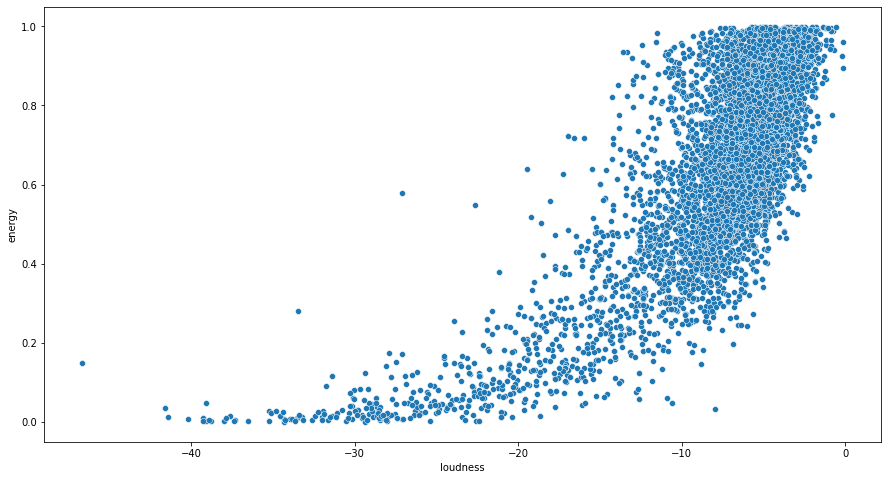

In [11]:
plt.figure(figsize=(15,8))

sns.scatterplot( df_spotify['loudness'], df_spotify['energy'])

Podemos ver que se cumple esta relación, y a medida que aumenta el volumen general ("loudness") aumenta la energía de la pista. 

Notar que la relación es similar a función exponencial.

# 

### Analisis danceability - target

Consideramos que hay relación entre las canciones con mayor capacidad de baile. 

Esperamos que, a mayor capacidad de baile, mayor cantidad de canciones que son hits habrá.

Veamoslo

In [12]:
#Quedemosnos con 3 columnas de utilidad.
#Redondeamos a 1 decimal la capacidad de baile, nos quedarán 10 barras.
#Agrupando por target y capacidad de baile redondeada, veamos la cantidad de canciones que tenemos

df_danceability_tracks = df_spotify[['danceability', 'target', 'track']]

df_danceability_tracks['danceability'] = df_danceability_tracks['danceability'].round(1)

df_danceability_tracks = df_danceability_tracks.groupby(by=['target', 'danceability']).count().reset_index()

df_danceability_tracks


c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\ipykernel_launcher.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  import sys


,target,danceability,track
0,0,0.1,110
1,0,0.2,365
2,0,0.3,377
3,0,0.4,484
4,0,0.5,557
5,0,0.6,504
6,0,0.7,407
7,0,0.8,295
8,0,0.9,94
9,0,1.0,6


<AxesSubplot:xlabel='danceability', ylabel='track'>

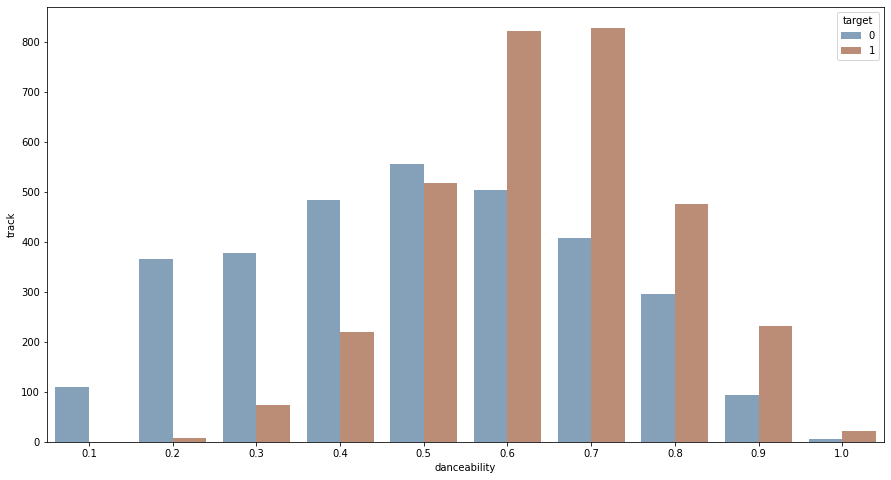

In [13]:
#Grafiquemos, por capacidad de baile, la cantidad de canciones. Esto teniendo 1 barra por target

plt.figure(figsize=(15,8))

sns.barplot(data=df_danceability_tracks, x=df_danceability_tracks['danceability'], 
            y=df_danceability_tracks['track'], hue='target', palette='twilight_shifted')

Tal como se dedujo, a menor capacidad de baile, hay más pistas que no son hits.

Con un valor de "danceability" intermedio (en torno a 0.5), la cantidad de psitas que son hits y la cantidad de pistas que no lo son, es muy similar.

A partir de valores de danceability mayores a 0.6, hay mucha mayor cantidad de pistas que son hits respecto a las que no lo son.

# 

### Análisis tempo - danceability

El tempo es la velocidad o el ritmo de una pista.

Sabemos que "danceability" es la capacidad de baile.

Si bien el tempo, entre otras variables, influye en la capacidad de baile. Hay una alta relación entre estas?

c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='tempo', ylabel='danceability'>

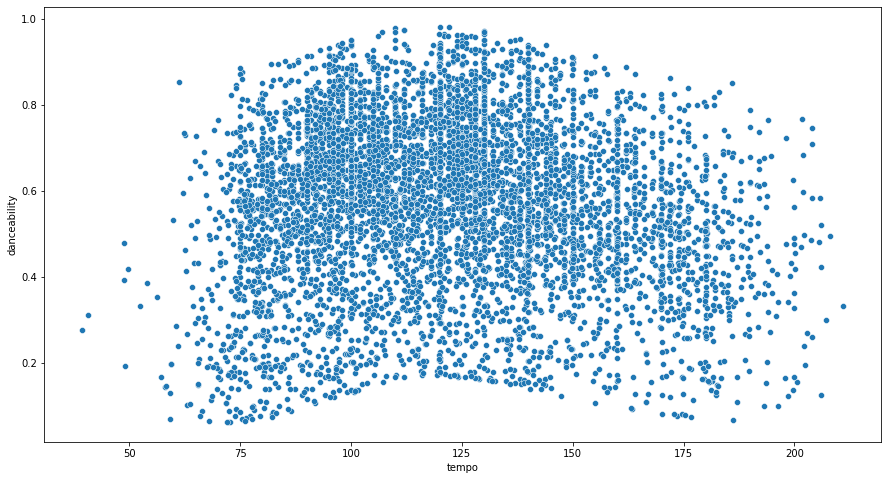

In [14]:
plt.figure(figsize=(15,8))

sns.scatterplot( df_spotify['tempo'], df_spotify['danceability'])

A pesar de que vemos una especie de parábola con vértice en tempo=125, podemos ver que los datos están completamente dispersos, por lo que no hay una alta relación entre estas 2 variables

# 

### Analisis liveness - acousticness

Queremos analizar la relación entre las variables liveness y acousticness. Se espera que, o sea una pista en vivo, o sea una pista acústica, siendo estas variables relacionadas de forma inversa.

No se esperan valores en donde ambos sean 0 o ambos sea 1.

c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='acousticness', ylabel='liveness'>

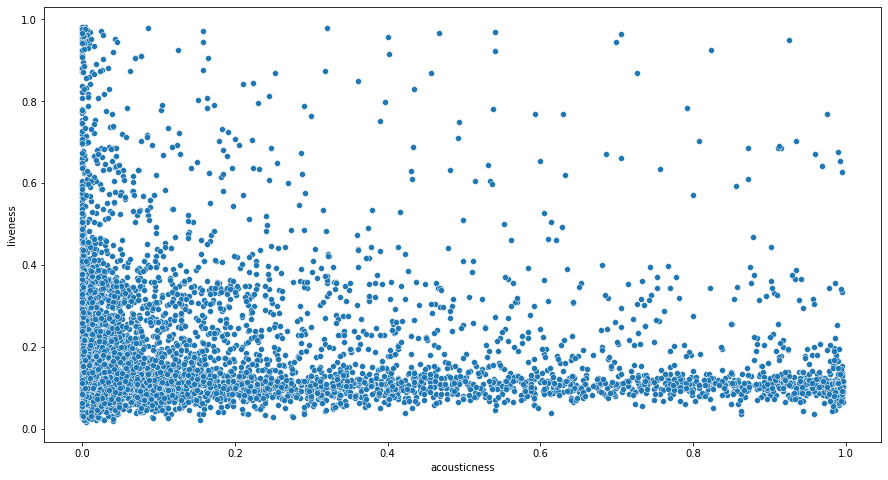

In [15]:
plt.figure(figsize=(15,8))

sns.scatterplot( df_spotify['acousticness'], df_spotify['liveness'])

Viendo la relación entre ambas variables, no encontramos lo que esperamos.

Si bien vemos que no hay muchos casos deonde ambos valores tiendan a 1, vemos que hay una gran concentración de valores donde ambas variables están cercanas a 0.

# 

### Análisis energy - tempo

Siendo la energía una medida perceptiva de intesidad, y el tempo la velocidad o el ritmo, podría considerarse que estas variables están relacionadas

c:\users\usuario\appdata\local\programs\python\python37\lib\site-packages\seaborn\_decorators.py:43: FutureWarning: Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.
  FutureWarning


<AxesSubplot:xlabel='energy', ylabel='tempo'>

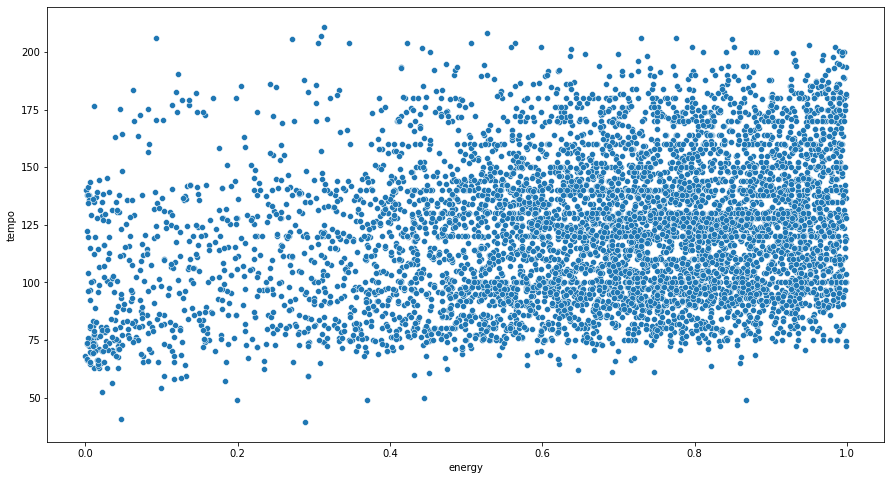

In [16]:
plt.figure(figsize=(15,8))

sns.scatterplot( df_spotify['energy'], df_spotify['tempo'], palette='colorblind')

Vemos una alta dispersión de estas variables, por lo que la correlación es baja.

Puede destacarse una concentración en valores altos de energía, es decir, hay mas pistas con valores altos de energía

# 

# 

## ANÁLISIS RESUMEN

Luego de haber hecho análisis bivariados respecto a comportamientos esperados tomados de a 2 variables, y contrastado los resultados con la hipótesis inicial o el valor buscado, podemos ver el resumen de las relaciones entre las variables

# 

### Veamos las correlaciones de las variables

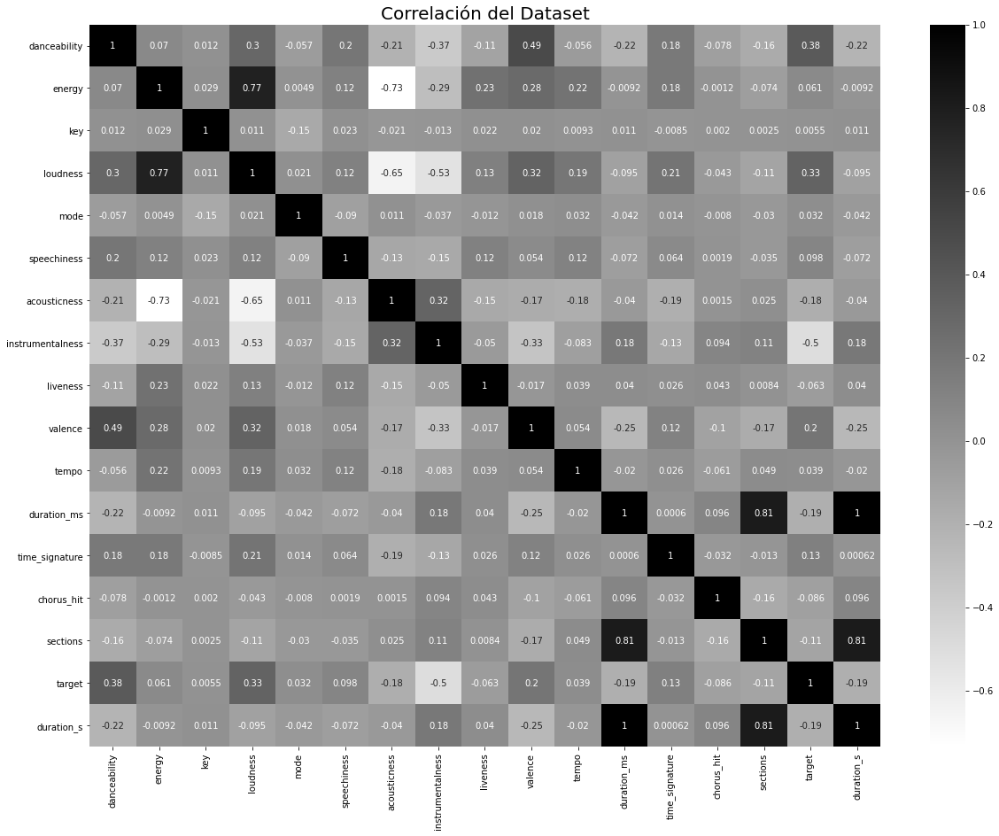

In [24]:
plt.title('Correlación del Dataset', fontsize=20)
plt.rcParams['figure.figsize'] = (20, 20)

sns.heatmap(df_spotify.corr(), annot=True, cmap='binary')
plt.show()

Podemos ver que las variables con alta correlación son:

- loudness - energy
- acousticness - energy
- acousticness - loudness
- instrumentalness - loudness
- sections - duration_ms


# 

### Dispersión entre variables sin distinción de target

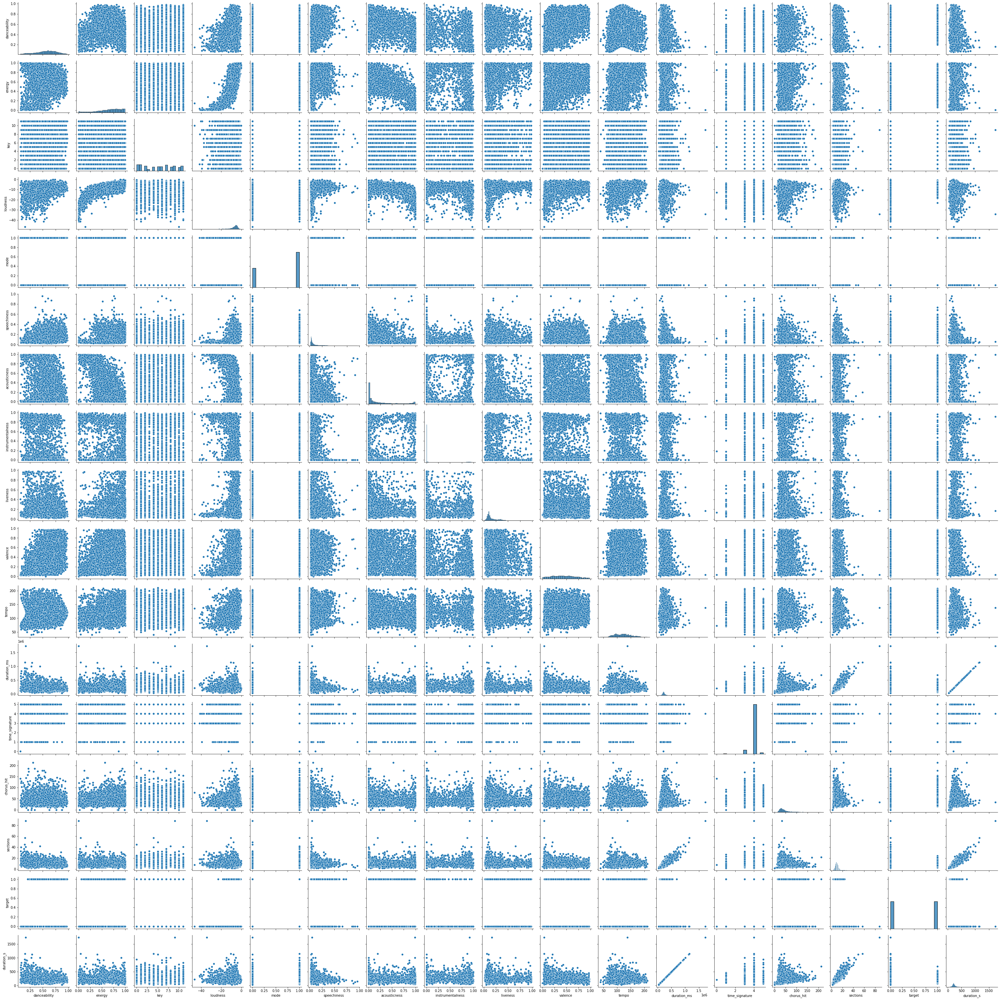

In [18]:
sns.pairplot(df_spotify)

# 

### Dispersión entre variables con distinción de target

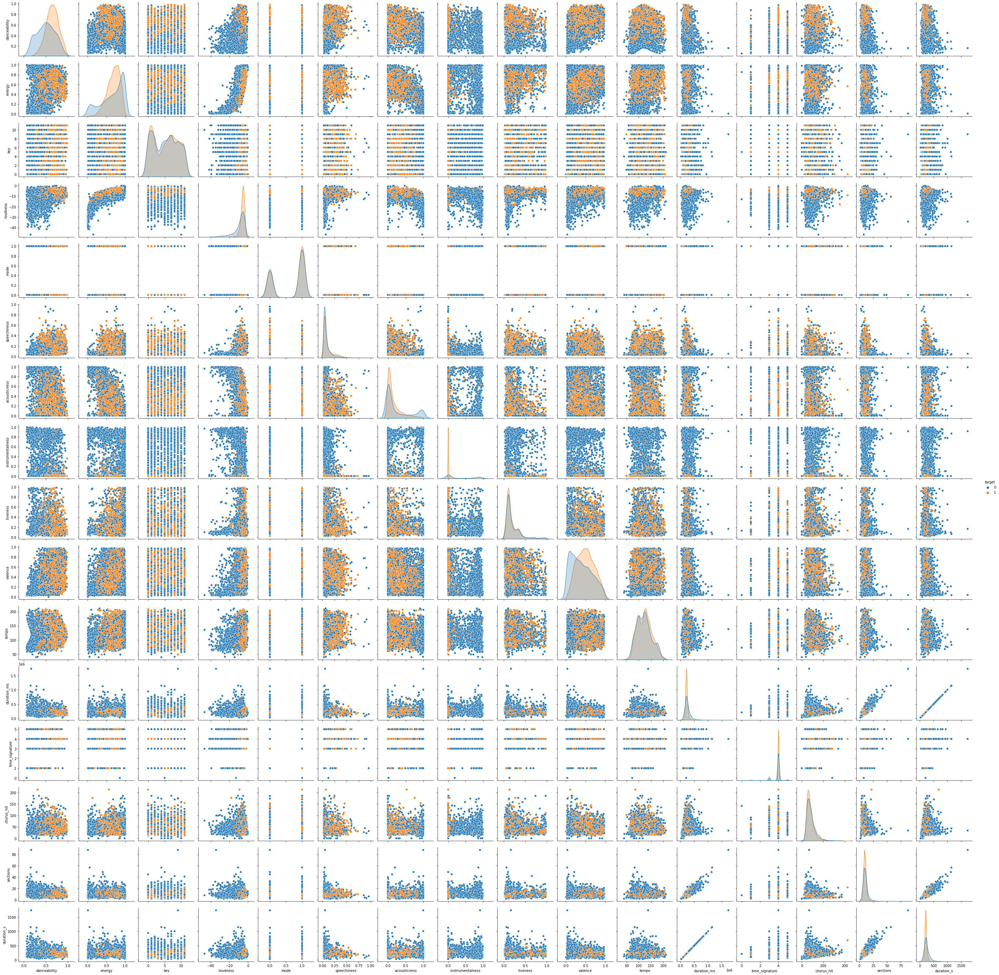

In [19]:
sns.pairplot(df_spotify, hue="target")

# 

### Reporte con resumen, características globales del dataset, y características particulares de variables

In [1]:
#pandas_profiling.ProfileReport(df_spotify)